## Descriptive Analysis of Covid-19: World + India
Source: GitHub+Kaggle, Size: (74484, 7), (1267, 15), (4692, 10)

### Importing necessary libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)
from datetime import datetime

## Current Global level

In [3]:
# load 19 Jan data
vacc_df = pd.read_csv("./country_vaccinations.csv")
daily_df = pd.read_csv("./world_daily_data_2021-01-19.csv")

In [4]:
def str_to_date(text: str):
    return datetime.strptime(text, '%Y-%m-%d')

### 1. Growth in new cases
#### Observations:
- The number of new cases in the world has increased to 8 times the number in March
- With the administration of vaccine, we see a slight flattenning around Dec-Jan

In [5]:
daily = daily_df.copy()
daily.date = daily.date.apply(str_to_date)
daily_new_graphs = daily.groupby('date')['daily_new_cases'].sum()
fig = px.line(daily_new_graphs, title="Global new cases")
fig.show()

### 2. Country wise vaccine preference
#### Observations:
- India is mainly using Covaxin, Covishield
- Worldwide, the most commonly used one is Pfizer, Moderna

In [6]:
country_vaccine = vacc_df.groupby(["country", "iso_code", "vaccines"])['total_vaccinations', 
                                                                       'total_vaccinations_per_hundred',
                                                                      'daily_vaccinations',
                                                                      'daily_vaccinations_per_million',
                                                                      'people_vaccinated',
                                                                      'people_vaccinated_per_hundred'
                                                                      ].max().reset_index()
country_vaccine.columns = ["Country", "iso_code", "Vaccines", "Total vaccinations", "Percent", "Daily vaccinations", 
                           "Daily vaccinations per million", "People vaccinated", "People vaccinated per hundred"]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:6: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [7]:
fig = px.choropleth(locations=country_vaccine['Country'], 
                    locationmode="country names",
                    color=country_vaccine['Vaccines'],
                    title="Vaccine use around the globe",
                   )
fig.update_layout({'legend_orientation':'h'})
fig.update_layout({'legend_title':'Vaccine scheme'})
fig.show()

### 3. Vaccination counts
#### Observations:
- Nearly 20M people have taken the Pfizer vaccine worldwide
- Approx 15M have taken Sinovac

In [8]:
vaccine = vacc_df.groupby(["vaccines"])['total_vaccinations','total_vaccinations_per_hundred',
                                       'daily_vaccinations','daily_vaccinations_per_million'].max().reset_index()
vaccine.columns = ["Vaccines", "Total vaccinations", "Percent", "Daily vaccinations", 
                           "Daily vaccinations per million"]
def draw_trace_bar_vaccine(data, feature, title, xlab, ylab,color='Blue'):
    data = data.sort_values(feature, ascending=False)
    trace = go.Bar(
            x = data['Vaccines'],
            y = data[feature],
            marker=dict(color=color),
            text=data['Vaccines']
        )
    data = [trace]

    layout = dict(title = title,
              xaxis = dict(title = xlab, showticklabels=True, tickangle=45, 
                           zeroline=True, zerolinewidth=1, zerolinecolor='grey',
                           showline=True, linewidth=2, linecolor='black', mirror=True,
                          tickfont=dict(
                            size=10,
                            color='black'),), 
              yaxis = dict(title = ylab, gridcolor='lightgrey', zeroline=True, zerolinewidth=1, zerolinecolor='grey',
                          showline=True, linewidth=2, linecolor='black', mirror=True),
              plot_bgcolor = 'rgba(0, 0, 0, 0)', paper_bgcolor = 'rgba(0, 0, 0, 0)',
              hovermode = 'closest'
             )
    fig = dict(data = data, layout = layout)
    iplot(fig, filename='draw_trace')
draw_trace_bar_vaccine(vaccine, 'Total vaccinations', 'Total per vaccine scheme', 'Vaccine', 'Vaccination total', "darkmagenta" )

/usr/lib/python3/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



### 4. Countries grouped by vaccine
Below is a treemap showing the same

In [9]:
fig = px.treemap(country_vaccine, path = ['Vaccines', 'Country'], values = 'Total vaccinations',
                title="Total vaccinations per country, grouped by vaccine scheme")
fig.show()

### 5. Vaccination trend
#### Observations:
- USA & China have actively adopted vaccination
- UK & Israel follow next
- India  is still in the initial phase of vaccination
- Below table shows the total people vaccinated country wise. Highest count relative to population is in Israel: 38%

In [10]:
country_vaccine.sort_values('People vaccinated', ascending=False).head(10)

,Country,iso_code,Vaccines,Total vaccinations,Percent,Daily vaccinations,Daily vaccinations per million,People vaccinated,People vaccinated per hundred
52,United States,USA,"Moderna, Pfizer/BioNTech",17546374.0,5.30,913912.0,2761.0,15053257.0,4.55
8,China,CHN,"CNBG, Sinovac",15000000.0,1.04,714286.0,496.0,15000000.0,1.04
51,United Kingdom,GBR,"Oxford/AstraZeneca, Pfizer/BioNTech",5437284.0,8.01,297294.0,4379.0,4973248.0,7.33
25,Israel,ISR,Pfizer/BioNTech,3292190.0,38.04,157344.0,18178.0,2441379.0,28.21
50,United Arab Emirates,ARE,"Pfizer/BioNTech, Sinopharm",2246069.0,22.71,114896.0,11617.0,1996069.0,20.18
17,Germany,DEU,"Moderna, Pfizer/BioNTech",1401693.0,1.67,74872.0,894.0,1324091.0,1.58
26,Italy,ITA,Pfizer/BioNTech,1282184.0,2.12,81897.0,1355.0,1257118.0,2.08
49,Turkey,TUR,Sinovac,1122988.0,1.33,308326.0,3656.0,1122988.0,1.33
46,Spain,ESP,"Moderna, Pfizer/BioNTech",1103301.0,2.36,70264.0,1503.0,1054245.0,2.25
22,India,IND,"Covaxin, Covishield",1043534.0,0.08,191181.0,139.0,1043534.0,0.08


In [11]:
def draw_trace_bar(data, feature, title, xlab, ylab,color='Blue'):
    data = data.sort_values(feature, ascending=False)
    trace = go.Bar(
            x = data['Country'],
            y = data[feature],
            marker=dict(color=color),
            text=data['Country']
        )
    data = [trace]

    layout = dict(title = title,
              xaxis = dict(title = xlab, showticklabels=True, tickangle=45,
                          tickfont=dict(
                            size=10,
                            color='black'),), 
              yaxis = dict(title = ylab),
              hovermode = 'closest'
             )
    fig = dict(data = data, layout = layout)
    iplot(fig, filename='draw_trace')

In [12]:
draw_trace_bar(country_vaccine, 'People vaccinated', 'People vaccinated per country', 'Country',\
               'People vaccinated', "lightblue" )

<Figure size 432x288 with 0 Axes>

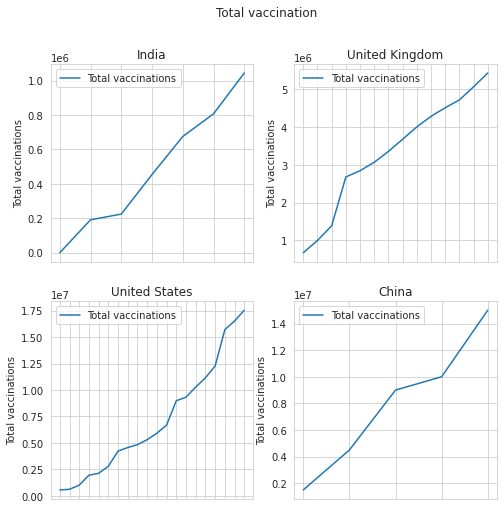

In [13]:
country_vaccine_time = vacc_df[["country", "vaccines", "date", 'total_vaccinations', 'total_vaccinations_per_hundred']].dropna()
country_vaccine_time.columns = ["Country", "Vaccines", "Date", 'Total vaccinations', 'Percent']
def plot_time_variation_countries_group_of_features(df, countries, features,title):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(2, 2,figsize=(8,8))

    for country in countries:
        plt.subplot(2, 2,i + 1)
        df_ = df[(df['Country']==country)] 
        for feature in features:
            g = sns.lineplot(x="Date", y=feature, data=df_,  label=feature)
        plt.title(f'{country}') 
        plt.xlabel('')
        plt.tick_params(
            axis='x',          
            which='both',      
            bottom=False,      
            top=False,         
            labelbottom=False) 
        i = i + 1
    fig.suptitle(title)
    plt.show()
countries = ['India', 'United Kingdom', 'United States', 'China']
features = ['Total vaccinations']
plot_time_variation_countries_group_of_features(country_vaccine_time, countries, features, 'Total vaccination')

## National level during lockdown

In [14]:
# colors
cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # dead - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active - yellow

### Reading data

In [15]:
# all
df = pd.read_csv('./covid-19-india-data/complete.csv')
# daily
daily = pd.read_csv('./covid-19-india-data/nation_level_daily.csv')
# state level
states_latest = pd.read_csv('./covid-19-india-data/state_level_latest.csv')
# district level
dist_latest = pd.read_csv('./covid-19-india-data/district_level_latest.csv')
# tests day by day
tests_dbd = pd.read_csv('./covid-19-india-data/tests_day_wise.csv')
# state wise tests statistics
state_tests = pd.read_csv('./covid-19-india-data/tests_state_wise.csv')
# Patient level data
p_df = pd.read_csv('./covid-19-india-data/patients_data.csv')

/usr/lib/python3/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (4,12,13,14,15,18,19) have mixed types.Specify dtype option on import or set low_memory=False.



### Preprocessing

### 6. Brief overview of covid case statistics state-wise
#### Observations:
- Gujarat & Maharashtra had highest mortality rates
- Delhi & haryana had highest recover rates

In [16]:
# convert datetime datatype
df['Date'] = pd.to_datetime(df['Date'])
df.columns = ['Date', 'State', 'Latitude', 'Longitude', 'Confirmed', 'Deaths', 'Recovered', 'New cases', 'New deaths', 'New recovered']
# convert datetime datatype
daily['Date'] = pd.to_datetime(daily['Date'] + ' 2020')
# get no. of active cases
daily['Total Active'] = daily['Total Confirmed'] - daily['Total Deceased'] - daily['Total Recovered']
# Deaths / 100 cases
daily['Deaths / 100 Cases'] = round((daily['Total Deceased'] / daily['Total Confirmed'])*100, 2)
# Recovered / 100 cases
daily['Recovered / 100 Cases'] = round((daily['Total Recovered'] / daily['Total Confirmed'])*100, 2)
# Deaths / 100 recovered
daily['Deaths / 100 Recovered'] = round((daily['Total Deceased'] / daily['Total Recovered'])*100, 2)

# remove the row containing 'Total'
states_latest = states_latest[states_latest['State']!='Total']
# mortality rate
states_latest['Mortality Rate'] = round((states_latest['Deaths'] / states_latest['Confirmed'])*100, 2)
# recovery rate
states_latest['Recovery Rate'] = round((states_latest['Recovered'] / states_latest['Confirmed'])*100, 2)

# remove the column containing unassigned state values
dist_latest = dist_latest[dist_latest['State'] != 'State Unassigned']
dist_latest['Mortality Rate'] = round((dist_latest['Deceased'] / dist_latest['Confirmed'])*100, 2)
dist_latest['Recovery Rate'] = round((dist_latest['Recovered'] / dist_latest['Confirmed'])*100, 2)

tests_dbd['Update Time Stamp'] = tests_dbd['Update Time Stamp'].str.extract('(\d{1,2}/\d{1,2}/\d{4})')
tests_dbd['Update Time Stamp'] = pd.to_datetime(tests_dbd['Update Time Stamp'], format='%d/%m/%Y')

# fixing date format
for col in ['Date Announced', 'Estimated Onset Date', 'Status Change Date']:
    p_df[col] = pd.to_datetime(p_df[col], format='%d/%m/%Y')
# fix nationality values
p_df['Nationality'] = p_df['Nationality'].replace('Indian', 'India')

# sort based on confirmed cases
latest = states_latest.sort_values('Confirmed', ascending=False).reset_index(drop=True)
# remove 'State Unassigned' row
latest = latest[latest['State']!='State Unassigned']
# rearrange columns
latest = latest.loc[:, ['State', 'Confirmed', 'Active', 'Deaths', 'Mortality Rate', 'Recovered', 'Recovery Rate']]

# background color
latest.style\
    .background_gradient(cmap="Blues", subset=['Confirmed', 'Active'])\
    .background_gradient(cmap="Reds", subset=['Deaths', 'Mortality Rate'])\
    .background_gradient(cmap="Greens", subset=['Recovered', 'Recovery Rate'])

,State,Confirmed,Active,Deaths,Mortality Rate,Recovered,Recovery Rate
0,Maharashtra,479779,146305,16792,3.500000,316375,65.940000
1,Tamil Nadu,279144,53486,4571,1.640000,221087,79.200000
2,Andhra Pradesh,196789,82166,1753,0.890000,112870,57.360000
3,Karnataka,158254,75067,2897,1.830000,80281,50.730000
4,Delhi,141531,10348,4059,2.870000,127124,89.820000
5,Uttar Pradesh,108974,43654,1918,1.760000,63402,58.180000
6,West Bengal,86754,23829,1902,2.190000,61023,70.340000
7,Telangana,73050,20358,589,0.810000,52103,71.330000
8,Bihar,68148,23939,388,0.570000,43820,64.300000
9,Gujarat,67811,14708,2579,3.800000,50524,74.510000


### 7. Total Cured, Dead, Recovered numbers
#### Observations:
- A vast majority of the people (60%) have been cured
- Around 10% died

In [17]:
temp = latest[['Active', 'Deaths', 'Recovered']]
temp.columns = ['Active', 'Deaths', 'Cured']
tm = temp.melt(value_vars=['Active', 'Deaths', 'Cured'])
fig_1 = px.treemap(tm, path=["variable"], values="value", height=250, 
                 color_discrete_sequence=[act, rec, dth], title='Latest statistics')
fig_1.data[0].textinfo = 'label+text+value'
fig_1.show()

### 7. Trends across March-Aug

In [18]:
def plot_daily(col, hue):
    fig = px.bar(daily, x="Date", y=col, title=col, 
                 color_discrete_sequence=[hue])
    fig.update_layout(title=col, xaxis_title="", yaxis_title="")
    fig.show()

In [19]:
plot_daily('Total Confirmed', '#000000')

In [20]:
plot_daily('Daily Confirmed', '#000000')

In [21]:
plot_daily('Total Active', '#000000')

In [22]:
plot_daily('Total Deceased', dth)

In [23]:
plot_daily('Daily Deceased', dth)

In [24]:
plot_daily('Total Recovered', rec)

In [25]:
plot_daily('Daily Recovered', rec)

### 8. Testing trends

In [26]:
def plot_daily(col, hue):
    temp = tests_dbd.copy()
    fig = px.scatter(temp, x="Update Time Stamp", 
                 y=col, title=col, 
                 color_discrete_sequence=[hue])
    fig.update_layout(title=col, xaxis_title="", yaxis_title="")
    fig.show()

In [27]:
plot_daily('Total Samples Tested', dth)

In [28]:
temp = daily[['Date', 'Total Active', 'Total Deceased', 'Total Recovered']]
temp = temp.melt(value_vars=['Total Recovered', 'Total Deceased', 'Total Active'],
                 id_vars="Date", var_name='Case', value_name='Count')
temp.head()
fig_2 = px.bar(temp, x="Date", y="Count", color='Case', 
               title='Cases over time', color_discrete_sequence = [rec, dth, act])
fig_2.show()

In [29]:
temp = daily[['Date', 'Daily Confirmed', 'Daily Deceased', 'Daily Recovered']]
temp = temp.melt(value_vars=['Daily Recovered', 'Daily Deceased', 'Daily Confirmed'],
                 id_vars="Date", var_name='Case', value_name='Count')
temp.head()
fig_2 = px.bar(temp, x="Date", y="Count", color='Case', 
               title='Daily cases over time', color_discrete_sequence = [rec, dth, act])
fig_2.show()

### 9. Satewise trends

In [30]:
def plot_stacked(col):
    temp = df.sort_values(col, ascending=False)
    fig = px.bar(df, x="Date", y=col, color='State', 
                 color_discrete_sequence = px.colors.qualitative.Vivid)
    fig.update_layout(title='State wise '+ col, xaxis_title="", yaxis_title="", 
                      showlegend=False)
    fig.show()

In [31]:
plot_stacked('Confirmed')

In [32]:
plot_stacked('Deaths')

In [33]:
plot_stacked('Recovered')

In [34]:
# Daily statistics

temp = daily[daily['Total Confirmed'] > 100]

fig_c = px.line(temp, x="Date", y="Deaths / 100 Cases", color_discrete_sequence=['#000000'])
fig_d = px.line(temp, x="Date", y="Recovered / 100 Cases", color_discrete_sequence=['#649d66'])
fig_r = px.line(temp, x="Date", y="Deaths / 100 Recovered", color_discrete_sequence=['#ff677d'])

fig = make_subplots(rows=1, cols=3, shared_xaxes=False, 
                    subplot_titles=('No. of Deaths to 100 Cases', 
                                    'No. of Recovered to 100 Cases', 
                                    'No. of Deaths to 100 Recovered'))

fig.add_trace(fig_c['data'][0], row=1, col=1)
fig.add_trace(fig_d['data'][0], row=1, col=2)
fig.add_trace(fig_r['data'][0], row=1, col=3)

### 10. States affected trend

In [35]:
temp = pd.DataFrame(df.groupby('Date').apply(len), columns=['No. of states affected']).reset_index()
temp['Total no. of States/UT'] = 36
temp = temp.melt(id_vars='Date', value_vars=['No. of states affected', 'Total no. of States/UT'])
temp.head()

fig_s = px.line(temp, x="Date", y="value", color='variable', line_dash='variable', 
                color_discrete_sequence=['#000000', '#ef1223'])
fig_s.update_layout(title='No. of States/UT affected', 
                  xaxis_title='', yaxis_title='')
fig_s.show()

In [36]:
temp = daily.loc[:, ['Date', 'Total Active', 'Total Recovered']]
temp = temp.melt(id_vars='Date', value_vars=['Total Active', 'Total Recovered'])
temp.head()

fig_c = px.line(temp, x="Date", y="value", color='variable', line_dash='variable', 
                color_discrete_sequence=[dth, rec])
fig_c.update_layout(title='Active vs Recovered cases', 
                  xaxis_title='', yaxis_title='')
fig_c.show()

### 11. Leading States

In [37]:
def plot_topn_states(col, color, n):
    df = states_latest.sort_values(col, ascending=False).head(n)
    fig = px.bar(df, x=col, y='State', text=col, 
                 orientation='h', 
                 color_discrete_sequence=[color])
    fig.update_layout(title=col, xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      showlegend=False)
    fig.show()

In [38]:
px.scatter(states_latest[states_latest['Confirmed']>10000], x='Confirmed', y='Deaths', 
           color='State', size='Confirmed', text='State', 
           log_x =True, log_y=True, title='Confirmed vs Death (Only States with more than 10000 cases)')

### 12. Compact tree view upto district level

In [39]:
temp = dist_latest.groupby(['State', 'District'])['Confirmed'].sum().reset_index()
temp.head()
fig = px.treemap(temp, path=["State", "District"], values="Confirmed", 
                 height=700, title='Number of Confirmed Cases', 
                 color_discrete_sequence = px.colors.qualitative.Vivid)
fig.data[0].textinfo = 'label+text+value'
fig.show()

### 13. Profile of affected patients

In [40]:
def print_missing(col):
    print('Total no. of values :', p_df.shape[0], \
          '\nNo. of missing values :', p_df.shape[0]-p_df[[col]].dropna().shape[0], \
          '\nNo. of available values :', p_df.shape[0]-(p_df.shape[0]-p_df[[col]].dropna().shape[0]))

In [41]:
print_missing('Age Bracket')

px.histogram(p_df, x='Age Bracket', color_discrete_sequence = ['#35495e'], 
             nbins=50, title='Distribution of ages of confirmed patients')

Total no. of values : 247236 
No. of missing values : 139206 
No. of available values : 108030


In [42]:
def print_missing_vals():
    print('Total no. of values :', p_df.shape[0], 
          '\nNo. of missing values :', p_df.shape[0]-temp.shape[0], 
          '\nNo. of available values :', p_df.shape[0]-(p_df.shape[0]-temp.shape[0]))

In [43]:
fig = make_subplots(
    rows=1, cols=2, column_widths=[0.8, 0.2],
    subplot_titles = ['Gender vs Age', ''],
    specs=[[{"type": "histogram"}, {"type": "pie"}]]
)

temp = p_df[['Age Bracket', 'Gender']].dropna()

print_missing_vals()

gen_grp = temp.groupby('Gender').count()

fig.add_trace(go.Histogram(x=temp[temp['Gender']=='F']['Age Bracket'], nbinsx=50, name='Female', marker_color='#6a0572'), 1, 1)
fig.add_trace(go.Histogram(x=temp[temp['Gender']=='M']['Age Bracket'], nbinsx=50, name='Male', marker_color='#39065a'), 1, 1)

fig.add_trace(go.Pie(values=gen_grp.values.reshape(-1).tolist(), labels=['Female', 'Male'], marker_colors = ['#6a0572', '#39065a']),1, 2)

fig.update_layout(showlegend=False)
fig.update_layout(barmode='stack')
fig.data[2].textinfo = 'label+text+value+percent'

fig.show()

Total no. of values : 247236 
No. of missing values : 139960 
No. of available values : 107276


In [44]:
fig = make_subplots(
    rows=1, cols=2, column_widths=[0.8, 0.2],
    subplot_titles = ['Cases vs Age', ''],
    specs=[[{"type": "histogram"}, {"type": "pie"}]]
)

temp = p_df[['Age Bracket', 'Current Status']].dropna()

print_missing_vals()

gen_grp = temp.groupby('Current Status').count()

fig.add_trace(go.Pie(values=gen_grp.values.reshape(-1).tolist(), labels=['Deceased', 'Hospitalized', 'Recovered'], 
                     marker_colors = ['#fd0054', '#393e46', '#40a798'], hole=.3),1, 2)

fig.add_trace(go.Histogram(x=temp[temp['Current Status']=='Deceased']['Age Bracket'], nbinsx=50, name='Deceased', marker_color='#fd0054'), 1, 1)
fig.add_trace(go.Histogram(x=temp[temp['Current Status']=='Recovered']['Age Bracket'], nbinsx=50, name='Recovered', marker_color='#40a798'), 1, 1)
fig.add_trace(go.Histogram(x=temp[temp['Current Status']=='Hospitalized']['Age Bracket'], nbinsx=50, name='Hospitalized', marker_color='#393e46'), 1, 1)

fig.update_layout(showlegend=False)
fig.update_layout(barmode='stack')
fig.data[0].textinfo = 'label+text+value+percent'

fig.show()

Total no. of values : 247236 
No. of missing values : 139206 
No. of available values : 108030


### Observations:
- 14K records don't have details related to age, gender for anonymity
- Available data shows that age group 25-35 is most affected
- Males have been more affected than females more than double
- Ages 55-75 show highest mortatlity rates

### 14. Transmission types
Below chart shows the distribution of various types

In [45]:
p_df['Type of transmission'] = p_df['Type of transmission'].replace('Imported ', 'Imported')
p_df['Type of transmission'] = p_df['Type of transmission'].replace('Unknown', 'TBD')

temp = pd.DataFrame(p_df[['Type of transmission']].groupby('Type of transmission')['Type of transmission'].count())
temp = temp.dropna()
temp.columns = ['count']
temp = temp.reset_index().sort_values(by='count')

print('Total no. of values :', p_df.shape[0], '\nNo. of missing values :', p_df.shape[0]-temp['count'].sum(), '\nNo. of available values :', temp['count'].sum())

fig = px.bar(temp, x='count', y='Type of transmission', orientation='h', text='count', width=600, height=300,
       color_discrete_sequence = ['#35495e'], title='Type of transmission')
fig.update_xaxes(title='')
fig.update_yaxes(title='')
fig.show()

Total no. of values : 247236 
No. of missing values : 244246 
No. of available values : 2990


### 15. Summary Statistics

In [46]:
# Global vaccination progress
vacc_df.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million
count,8.250000e+02,7.940000e+02,1.670000e+02,6.550000e+02,1210.000000,825.000000,794.000000,167.000000,1210.000000
mean,5.358327e+05,5.033639e+05,1.585566e+05,4.229382e+04,41897.679339,2.240776,2.130617,0.631377,1396.692562
std,1.661327e+06,1.516412e+06,3.596483e+05,1.088725e+05,108639.238350,4.707437,4.297168,1.331635,3111.614539
min,0.000000e+00,0.000000e+00,2.000000e+00,0.000000e+00,51.000000,0.000000,0.000000,0.000000,1.000000
25%,1.427600e+04,1.389925e+04,1.954500e+03,1.747500e+03,1606.000000,0.190000,0.200000,0.010000,255.250000
50%,5.604100e+04,5.507800e+04,8.262000e+03,7.521000e+03,5375.500000,0.690000,0.690000,0.050000,609.000000
75%,2.479330e+05,2.577658e+05,2.500000e+05,3.706950e+04,26379.000000,1.670000,1.712500,0.710000,1056.000000
max,1.754637e+07,1.505326e+07,2.394961e+06,1.130189e+06,913912.000000,38.040000,28.210000,9.830000,30869.000000


In [48]:
# Daily cases global
daily_df.describe()

,cumulative_total_cases,daily_new_cases,active_cases,cumulative_total_deaths,daily_new_deaths
count,7.448400e+04,68015.000000,7.346400e+04,68364.000000,57185.000000
mean,1.278598e+05,1420.382842,3.161198e+04,3850.112954,36.095654
std,8.033047e+05,8552.733049,2.651102e+05,18733.755820,159.273778
min,0.000000e+00,-1417.000000,-8.260000e+02,0.000000,-217.000000
25%,8.100000e+01,0.000000,1.100000e+01,3.000000,0.000000
50%,2.086000e+03,25.000000,4.070000e+02,58.000000,1.000000
75%,2.684800e+04,356.000000,5.147500e+03,626.000000,9.000000
max,2.480984e+07,308022.000000,9.681434e+06,411520.000000,4482.000000
